In [96]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt


## Note Book Description

Compile Final Dataset for Project

Includes :
- Dataset and Column Selection
- Preprocessing and Data Cleaning
- Visualization
- Table join with NYC Open Data Census Tract Shapefile

### Selected Metrics for Gentrification Score

- Median household income
- Home Value
- Rent
- Education
- Displacement of minor communities
- Age

### Neighbourhood Snapshots of 2010 and 2019 used

---
# Tables Used
---


## <b>Geography</b>

2010 Census Tracts for NYC ; Type - Shapefile

Link <https://data.cityofnewyork.us/City-Government/2010-Census-Tracts/fxpq-c8ku>

Note: Census tract data from data.census.gov consists fo census data for all NY state

---

## <b>Population and Demographics</b>

1. Decinial Census - 2010 and 2020 ; Type - csv
2. ACS Demographic and Housing Estimates - 2010 and 2019 ; Type - csv

2010 Decinial Census Table path : Decenial Census/DECENNIALPL2010.P1_data_with_overlays_2021-11-17T003605.csv
2020 Decinial Census Table path : Decenial Census/DECENNIALPL2020.P1_data_with_overlays_2021-11-17T003605.csv

2010 ACS Demographic table path : ACS_Demographics_and_Housing_Estimates/ACSDP5Y2010.DP05_data_with_overlays_2021-11-17T002059.csv
2019 ACS Demographic table path : 'ACS_Demographics_and_Housing_Estimates/ACSDP5Y2010.DP05_data_with_overlays_2021-11-17T002059.csv

Columns : Decinial Census Table 

yr:2010,2020

- NAME : Census Tract Name
- P001001,P1_001N : Total Population
- P001003,P1_003N : Total Population White Alone
- P001004,P1_004N : Total Population Black/African American Alone
- P001006,P1_006N : Total Population Asian Alone

Columns : ACS Demographic Table

- NAME : Census Tract Name
- DP05_0001E : Total Population
- DP05_0002E : Total Population Male
- DP05_0003E : Total Population Female
- DP05_0009E : Total Population between 25-34 yrs
- DP05_0017E : Median Age

Note : ACS Demographic and Housing table has population estimates by race and housing estimates too if needed.

---

## <b>Education</b>

1. Education Attainment - 2010 and 2019 ; type - csv

2010 Educational Attainment Table path : Education Attainment 2010 and 2019/ACSST5Y2010.S1501_data_with_overlays_2021-11-15T182641.csv

2019 Educational Attainment Table path : Education Attainment 2010 and 2019/ACSST5Y2019.S1501_data_with_overlays_2021-11-15T182641.csv

Columns : Educational Attainment 2010

- NAME : Census Tract Name
- S1501_C01_001E : Total Population between 18 and 24 yrs
- S1501_C01_003E : Total High School Graduate (Includes Equivalency)
- S1501_C01_004E : College or Associate Degree
- S1501_C01_005E : Bachelors Degree or higher
- S1501_C01_006E : Total Population 25 yrs and over
- S1501_C01_016E : Population between 25-34 yrs

---

## <b>Financial</b>

1. Housing and Financial Characteristics - S2503 - 2010 and 2019 ; type - csv

2010 Housing and Financial Characteristics Table Path : Housing Financial Characteristics - S2503/ACSST5Y2010.S2503_data_with_overlays_2021-11-17T012006.csv

2019 Housing and Financial Characteristics Table Path : Housing Financial Characteristics - S2503/ACSST5Y2019.S2503_data_with_overlays_2021-11-17T012006.csv

Columns : Housing and Financial Characteristics - 2010

- NAME : Census Tract Name
- S2503_C01_001E : Total Occupied Housing Units
- S2503_C01_013E : Median Household Income
- S2503_C01_028E : Median Monthly Housing Costs
- S2503_C01_053E : Gross Rent (percent Imputed) - *Cannot be used (not there in 2019 table)*

Columns : Housing and Financial Characteristics - 2019

- NAME : Census Tract Name
- S2503_C01_001E : Total Occupied Housing Units
- S2503_C01_013E : Median Household Income
- S2503_C01_028E : Median Monthly Housing Costs
- S2503_C01_024E : Median Monthly Housing Costs

---

## <b>Housing Stock</b>

1. Year Structure Built - B25034 - 2010 and 2019 ; type - csv

2010 Year Structure Built Table path : Year Structure Built - b25034/ACSDT5Y2010.B25034_data_with_overlays_2021-11-17T011510.csv

2010 Year Structure Built Table path : Year Structure Built - b25034/ACSDT5Y2019.B25034_data_with_overlays_2021-11-17T011510.csv

Columns : Housing Stock 2010

- NAME : Census Tract Name
- B25034_001E : Total House Count
- B25034_002E : Total Houses built between 2005 and 2010
- B25034_003E : Total Houses built between 2000 and 2004

Columns : Housing Stock 2019

- NAME : Census Tract Name
- B25034_001E : Total House Count
- B25034_002E : Total Houses built between 2014 and 2019
- B25034_003E : Total Houses built between 2010 and 2013

---

## <b>Displacement Demographics</b>

1. Geographical Mobility based on Income 2010 and 2019 ; type - csv

2010 Geographical Mobility Table path : GEOGRAPHICAL MOBILITY IN THE PAST YEAR BY INDIVIDUAL INCOME IN THE PAST 12 MONTHS/ACSDT5Y2010.B07010_data_with_overlays_2021-11-15T180633.csv

2019 Geographical Mobility Table path : GEOGRAPHICAL MOBILITY IN THE PAST YEAR BY INDIVIDUAL INCOME IN THE PAST 12 MONTHS/ACSDT5Y2019.B07010_data_with_overlays_2021-11-15T180633.csv

Columns : Geographical Mobility 2010 and 2019

- NAME : Census Tract Name
- B07010_001E : Total number of families 
- B07010_004E : Total Families with income between 1 - 10K
- B07010_005E : Total Families with income between 10K - 15K
- B07010_006E : Total Families with income between 15K - 25K

Note : Displacement based on race can be assessed using <u>Decennial census</u>  under <b>Population and Demographics</b>

---



---
# Table Preprocessing Steps
---
## Census Shapefile - 2010 NYC Census Tracts
- ### Rename <b>ctlabel</b> to ['Census_Tract']
- ### Retain columns=['boro_code', 'Census_Tract', 'shape_area', 'shape_leng','geometry']
- ### Data Cleaning : 
    - Missing Values for tracts - drop them
    - Data Validation - codes must be between 1-5

## All other Census Datasets
- ### Filter Necassary Columns
- ### Rename Columns to Readable Keys
- ### Split <b>NAME</b> to ['Census_Tract','County','State']
- ### Remove leading and trailing Spaces on Census_Tract
- ### Change type to 'float' for Census Tract
- ### Check for NUll Values
- ### Ensure Census Tracts are unique

# Table 1 : 2010 Census Tract for NYC

In [3]:
Census_Tract_path = '2010 Census Tracts/geo_export_139fc905-b132-4c03-84d5-ae9e70dded42.shp'

NYC_Census_Tract_gdf = gpd.read_file(Census_Tract_path)

In [46]:
NYC_Census_Tract_gdf.rename(columns={'ctlabel':'Census_Tract'},inplace=True)

In [47]:
NYC_Census_Tract_gdf.head()

,boro_code,boro_ct201,boro_name,cdeligibil,ct2010,Census_Tract,ntacode,ntaname,puma,shape_area,shape_leng,geometry
0,5,5000900,Staten Island,E,000900,9,SI22,West New Brighton-New Brighton-St. George,3903,2.497010e+06,7729.016794,"POLYGON ((-74.07921 40.64343, -74.07914 40.643..."
1,1,1009800,Manhattan,I,009800,98,MN19,Turtle Bay-East Midtown,3808,1.906016e+06,5534.200306,"POLYGON ((-73.96433 40.75638, -73.96479 40.755..."
2,1,1010200,Manhattan,I,010200,102,MN17,Midtown-Midtown South,3807,1.860993e+06,5687.802439,"POLYGON ((-73.97124 40.76094, -73.97170 40.760..."
3,1,1010400,Manhattan,I,010400,104,MN17,Midtown-Midtown South,3807,1.864600e+06,5693.036367,"POLYGON ((-73.97446 40.76229, -73.97491 40.761..."
4,1,1011300,Manhattan,I,011300,113,MN17,Midtown-Midtown South,3807,1.890907e+06,5699.860712,"POLYGON ((-73.98412 40.75484, -73.98460 40.754..."


<AxesSubplot:>

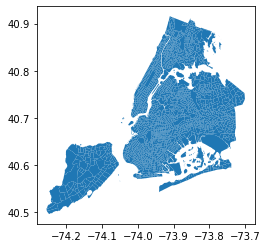

In [5]:
NYC_Census_Tract_gdf.plot()

# Table 2 : 
## (a) Decinial Census
## (b) ACS Demographic and Housing Estimates

In [35]:
# Decinial Census - Reading CSV files

Decenial_Census_2010_table_path = 'Decenial Census/DECENNIALPL2010.P1_data_with_overlays_2021-11-17T003605.csv'
Decenial_Census_2020_table_path = 'Decenial Census/DECENNIALPL2020.P1_data_with_overlays_2021-11-17T003605.csv'

Decenial_Census_2010_df = pd.read_csv(Decenial_Census_2010_table_path)
Decenial_Census_2020_df = pd.read_csv(Decenial_Census_2020_table_path)

In [36]:
#Taking only Desired Columns

Decenial_Census_2010_Interested_Columns = ['NAME','P001001','P001003','P001004','P001006']
Decenial_Census_2020_Interested_Columns = ['NAME','P1_001N','P1_003N','P1_004N','P1_006N']


"""
yr:2010,2020

- NAME : Census Tract Name
- P001001,P1_001N : Total Population
- P001003,P1_003N : Total Population White Alone
- P001004,P1_004N : Total Population Black/African American Alone
- P001006,P1_006N : Total Population Asian Alone"""

Decenial_Census_2010_df_reduced = Decenial_Census_2010_df[Decenial_Census_2010_Interested_Columns]
Decenial_Census_2020_df_reduced = Decenial_Census_2020_df[Decenial_Census_2020_Interested_Columns]

In [38]:
Decenial_Census_2020_df_reduced.head()

,NAME,P1_001N,P1_003N,P1_004N,P1_006N
0,Geographic Area Name,!!Total:,!!Total:!!Population of one race:!!White alone,!!Total:!!Population of one race:!!Black or A...,!!Total:!!Population of one race:!!Asian alone
1,"Census Tract 1, Albany County, New York",2073,388,1279,42
2,"Census Tract 2.01, Albany County, New York",3125,587,2027,104
3,"Census Tract 2.02, Albany County, New York",2598,224,1898,61
4,"Census Tract 3.01, Albany County, New York",3190,586,1919,88


In [39]:
Decenial_Census_2020_df_reduced[['Census_Tract','County','State']] = Decenial_Census_2020_df_reduced['NAME'].str.split(',',expand=True)

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [40]:
Decenial_Census_2020_df_reduced.head()

,NAME,P1_001N,P1_003N,P1_004N,P1_006N,Census_Tract,County,State
0,Geographic Area Name,!!Total:,!!Total:!!Population of one race:!!White alone,!!Total:!!Population of one race:!!Black or A...,!!Total:!!Population of one race:!!Asian alone,Geographic Area Name,None,None
1,"Census Tract 1, Albany County, New York",2073,388,1279,42,Census Tract 1,Albany County,New York
2,"Census Tract 2.01, Albany County, New York",3125,587,2027,104,Census Tract 2.01,Albany County,New York
3,"Census Tract 2.02, Albany County, New York",2598,224,1898,61,Census Tract 2.02,Albany County,New York
4,"Census Tract 3.01, Albany County, New York",3190,586,1919,88,Census Tract 3.01,Albany County,New York


In [41]:
Decenial_Census_2020_df_reduced.Census_Tract = Decenial_Census_2020_df_reduced.Census_Tract.str.replace(r'[a-zA-Z]','')

<ipython-input-41-3ffb8b957f6e>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  Decenial_Census_2020_df_reduced.Census_Tract = Decenial_Census_2020_df_reduced.Census_Tract.str.replace(r'[a-zA-Z]','')
/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [64]:
Decenial_Census_2020_df_reduced

,NAME,P1_001N,P1_003N,P1_004N,P1_006N,Census_Tract,County,State
0,Geographic Area Name,!!Total:,!!Total:!!Population of one race:!!White alone,!!Total:!!Population of one race:!!Black or A...,!!Total:!!Population of one race:!!Asian alone,,None,None
1,"Census Tract 1, Albany County, New York",2073,388,1279,42,1,Albany County,New York
2,"Census Tract 2.01, Albany County, New York",3125,587,2027,104,2.01,Albany County,New York
3,"Census Tract 2.02, Albany County, New York",2598,224,1898,61,2.02,Albany County,New York
4,"Census Tract 3.01, Albany County, New York",3190,586,1919,88,3.01,Albany County,New York
...,...,...,...,...,...,...,...,...
5407,"Census Tract 1503.01, Yates County, New York",2854,2715,5,4,1503.01,Yates County,New York
5408,"Census Tract 1503.02, Yates County, New York",2296,2167,10,6,1503.02,Yates County,New York
5409,"Census Tract 1504, Yates County, New York",3836,3577,50,31,1504,Yates County,New York
5410,"Census Tract 1505.01, Yates County, New York",1815,1667,10,7,1505.01,Yates County,New York


In [85]:
#Remove leading and trailing spaces
Decenial_Census_2020_df_reduced.Census_Tract = list(map(lambda x : x.replace(" ",""),Decenial_Census_2020_df_reduced.Census_Tract))

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [86]:
Decenial_Census_2020_df_reduced.head()

,NAME,P1_001N,P1_003N,P1_004N,P1_006N,Census_Tract,County,State
0,Geographic Area Name,!!Total:,!!Total:!!Population of one race:!!White alone,!!Total:!!Population of one race:!!Black or A...,!!Total:!!Population of one race:!!Asian alone,,None,None
1,"Census Tract 1, Albany County, New York",2073,388,1279,42,1,Albany County,New York
2,"Census Tract 2.01, Albany County, New York",3125,587,2027,104,2.01,Albany County,New York
3,"Census Tract 2.02, Albany County, New York",2598,224,1898,61,2.02,Albany County,New York
4,"Census Tract 3.01, Albany County, New York",3190,586,1919,88,3.01,Albany County,New York


In [82]:
a = list(Decenial_Census_2020_df_reduced.Census_Tract)
b = list(NYC_Census_Tract_gdf.Census_Tract)



l = list(map(lambda x : x.replace(" ",""),a))
m = list(map(lambda x : x.replace(" ",""),b))


c = [i for i in l if i in m]

In [84]:
len(c)

3066

In [87]:
#Zipcode_filtered_gdf = Zipcode_filtered_gdf.merge(Census_2019_filtered , on='ZIPCODE', how='left')
NYC_Census_Tract_gdf_test = NYC_Census_Tract_gdf.merge(Decenial_Census_2020_df_reduced, on='Census_Tract',how='left')

In [92]:
NYC_Census_Tract_gdf_test.P1_001N = NYC_Census_Tract_gdf_test.P1_001N.dropna().astype(int)

<AxesSubplot:>

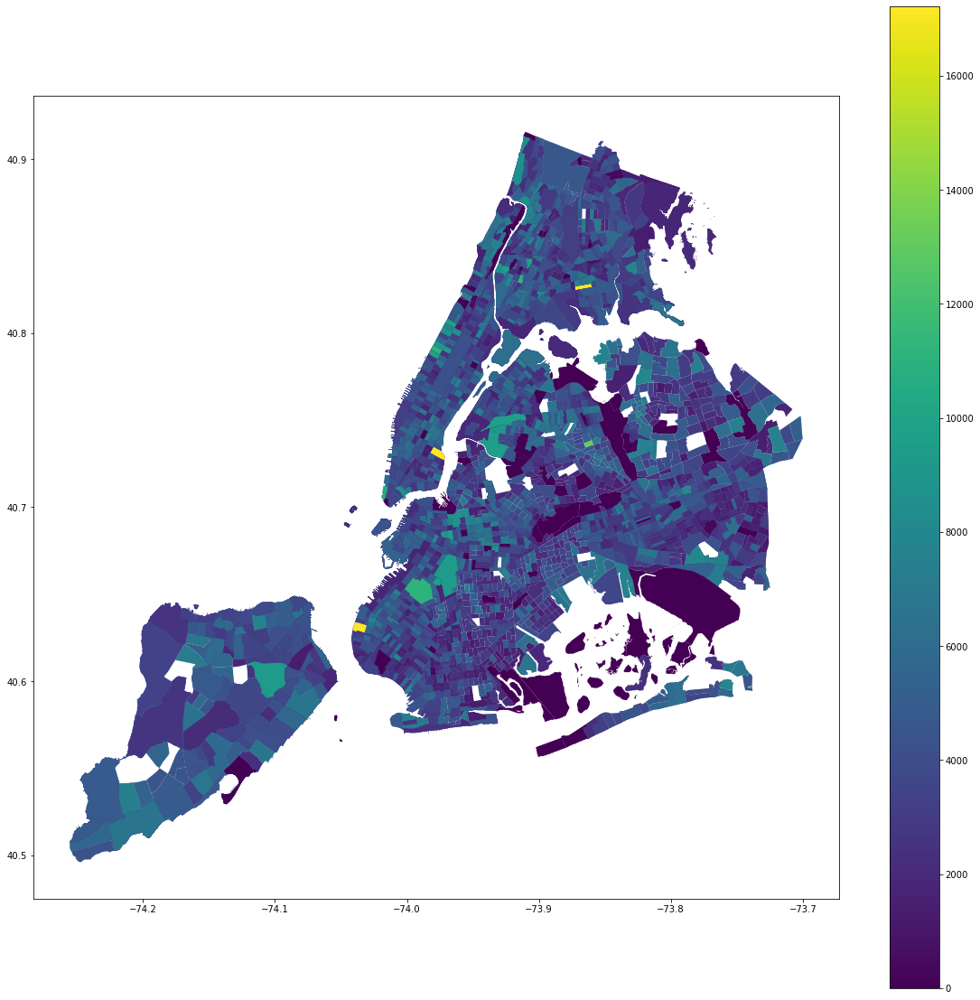

In [95]:
NYC_Census_Tract_gdf_test.plot(column='P1_001N',legend=True, figsize=(20,20))